In [1]:
import pathlib
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as Patches
import cv2 as cv

import sys
sys.path.append("..")
from FOTS.data_loader import *

In [2]:
def load_gt(path):
    bboxes = []
    texts = []
    with open(path) as f:
        for line in f:
            text = line.strip('\ufeff').strip('\xef\xbb\xbf').strip().split(',')
            x1, y1, x2, y2, x3, y3, x4, y4 = list(map(float, text[:8]))
            bbox = [[x1, y1], [x2, y2], [x3, y3], [x4, y4]]
            transcript = text[8]
            bboxes.append(bbox)
            texts.append(transcript)
    return np.array(bboxes, dtype=np.float32), texts

In [3]:
DATASET_PATH = r"C:\Users\ajava\Projekte\DataSets\ICDAR 2015\4.4\train"

structure = {
    'training': {
        'images': 'ch4_training_images',
        'gt': 'ch4_training_localization_transcription_gt',
        'voc_per_image': 'ch4_training_vocabularies_per_image',
        'voc_all': 'ch4_training_vocabulary.txt'
    },
    'test': {
        'images': 'ch4_test_images',
        'gt': 'Challenge4_Test_Task4_GT',
        'voc_per_image': 'ch4_test_vocabularies_per_image',
        'voc_all': 'ch4_test_vocabulary.txt'
    },
    'voc_generic': 'GenericVocabulary.txt'
    
}

data_root = pathlib.Path(DATASET_PATH)
images_root = data_root / structure['training']['images']
gt_root = data_root / structure['training']['gt']

images = [str(img) for img in images_root.glob("*.jpg")]
gt_paths = [str(gt_path) for gt_path in gt_root.glob("*.txt")]

bboxes = []
transcripts = []
for gt_path in gt_paths:
    gt_path = str(gt_path)
    bbxs, txts = load_gt(gt_path)
    bboxes.append(bbxs)
    transcripts.append(txts)

In [4]:
len(bboxes), len(images), len(transcripts)

(1000, 1000, 1000)

In [5]:
nimages = 5
indices = np.random.randint(0, len(images), nimages)

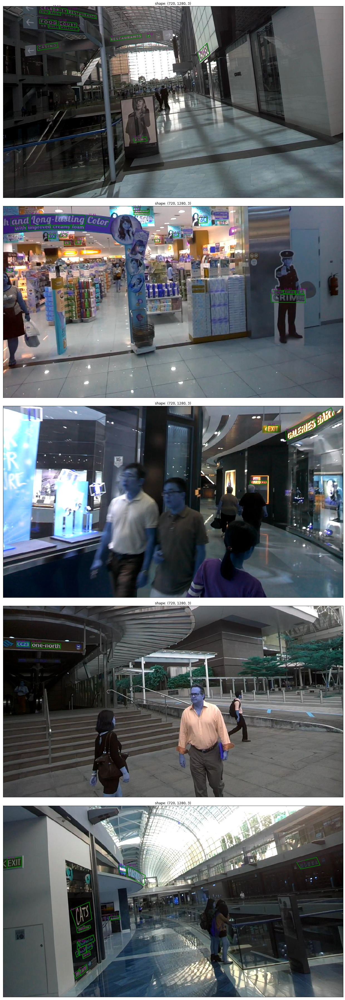

In [6]:
fig, axs = plt.subplots(nimages, 1, figsize=(250, 50))

axs = axs.flatten()

for i, idx in enumerate(indices):
    image = cv.imread(images[idx])
    bbox = bboxes[idx]
    axs[i].set_title("shape: {}".format(image.shape))
    axs[i].imshow(image)
    axs[i].set_xticks([])
    axs[i].set_yticks([])
    for poly in bbox:
        poly_h = min(abs(poly[3, 1] - poly[0, 1]), abs(poly[2, 1] - poly[1, 1]))
        poly_w = min(abs(poly[1, 0] - poly[0, 0]), abs(poly[2, 0] - poly[3, 0]))
        axs[i].add_artist(Patches.Polygon(
            poly, facecolor='none', edgecolor='green', linewidth=2, linestyle='-', fill=True))
        axs[i].text(poly[0, 0], poly[0, 1], '{:.0f}-{:.0f}'.format(poly_h, poly_w), color='purple')
plt.tight_layout()

In [10]:

for i, idx in enumerate(indices[0:2]):
    fig, axs = plt.subplots(4, 2, figsize=(200, 200))
    axs = axs.flatten()
    
    image = cv.imread(images[idx])
    bbox = bboxes[idx]
    transcript = transcripts[idx]
    text_tags = [True if (tag == '*' or tag == '###') else False for tag in transcript]
    h, w, _ = image.shape
    score_map, geo_map, training_mask, rectangles = generate_rbox((h, w), bbox, text_tags)
    
    axs[0].set_title("shape: {}".format(image.shape))
    axs[0].imshow(image)
    
    axs[2].set_title(score_map.shape)
    axs[1].imshow(score_map)
    
    axs[2].set_title(geo_map[:, :, 0].shape)
    axs[2].imshow(geo_map[:, :, 0])
    axs[3].imshow(geo_map[:, :, 1])
    axs[4].imshow(geo_map[:, :, 2])
    axs[5].imshow(geo_map[:, :, 3])
    axs[6].imshow(geo_map[:, :, 4])
    
    for poly in rectangles:
        poly = np.array(poly).reshape(4, 2)
        poly_h = min(abs(poly[3, 1] - poly[0, 1]), abs(poly[2, 1] - poly[1, 1]))
        poly_w = min(abs(poly[1, 0] - poly[0, 0]), abs(poly[2, 0] - poly[3, 0]))
        axs[0].add_artist(Patches.Polygon(
            poly, facecolor='none', edgecolor='green', linewidth=2, linestyle='-', fill=True))
        axs[0].text(poly[0, 0], poly[0, 1], '{:.0f}-{:.0f}'.format(poly_h, poly_w), color='purple')
    plt.tight_layout()